# Assignment 2

Contents:

- [x] Setup
    - [x] Config
    - [x] Modules
- [x] Comparison of an MLP and a CNN on the SVHN dataset
    - [x] Training the MLP
        - [x] Optimization of hyperparameters
        - [x] Training
        - [x] Evaluation
    - [x] Training the CNN
        - [x] Optimization of hyperparameters
        - [x] Training
        - [x] Evaluation
    - [x] Discussion
- [x] Visualization of convolutional kernels (weights) and activations (feature maps)
    - [x] Weights
    - [x] Feature maps
    - [x] Discussion
- [x] Comparison of regularization methods
    - [x] No regularization
    - [x] $\mathcal{L}_2$ regularization
    - [x] $\mathcal{L}_1$ regularization
    - [x] Discussion
- [x] Evaluation of custom learning rate warmup and learning rate scheduler
    - [x] Training
    - [x] Evaluation
    - [x] Discussion
- [ ] **Extra Point**
    - [ ] Train and evaluate a shallow [ConvMixer](https://arxiv.org/abs/2201.09792) model
    - [ ] Discussion

## Setup

### Config

In [1]:
import assignment.config as config

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/assignment/config.yaml


In [2]:
config.list_available()

['svhn_cnn', 'svhn_cnn_l1', 'svhn_cnn_l2', 'svhn_mlp']

### Modules

In [13]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import optuna
import torch
import torchsummary
import torchvision.models.feature_extraction as feature_extraction

import assignment.scripts.init_exp as init_exp
from assignment.evaluation.evaluator import Evaluator
from assignment.optimization_hyperparams.optimizer_hyperparams import OptimizerHyperparams
from assignment.training.trainer import Trainer
import assignment.libs.utils_checkpoints as utils_checkpoints
import assignment.libs.utils_data as utils_data
import assignment.libs.utils_model as utils_model
import assignment.libs.utils_optuna as utils_optuna
import assignment.visualization.plot as plot
import assignment.visualization.visualize as visualize

## Comparison of an MLP and a CNN on the SVHN dataset

### Training the MLP

In [4]:
path_dir_exp_mlp = Path(config._PATH_DIR_EXPS) / "svhn_mlp"

init_exp.init_exp(name_exp="svhn_mlp", name_config="svhn_mlp")
config.set_config_exp(path_dir_exp_mlp)

Initializing experiment svhn_mlp...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/assignment/configs/svhn_mlp.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp/config.yaml
Initializing experiment svhn_mlp finished
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_mlp/config.yaml


#### Optimization of hyperparameters

In [5]:
optimizer_hyperparams_mlp = OptimizerHyperparams(name_exp="svhn_mlp")
optimizer_hyperparams_mlp.create_study(load_if_exists=True)
optimizer_hyperparams_mlp.optimize(num_epochs=10, num_trials=50)

Creating study...


[I 2024-05-15 18:39:51,893] A new study created in RDB with name: study


Creating study finished
Optimizing...
    Trials    : 50
    Epochs    : 10


[I 2024-05-15 18:40:21,198] Trial 0 finished with value: 0.7606470106470107 and parameters: {'Learning rate': 0.00023775377441803875, 'Usage of bias': True, 'Dropout probability': 0.030895252767945934, 'Normalization layer': 'BatchNorm1d', 'Activation layer': 'ReLU', 'Hidden dimensions': '[2048]'}. Best is trial 0 with value: 0.7606470106470107.
[I 2024-05-15 18:40:50,220] Trial 1 finished with value: 0.7785967785967786 and parameters: {'Learning rate': 0.004734528845954143, 'Usage of bias': False, 'Dropout probability': 0.08701349395307593, 'Normalization layer': 'LayerNorm', 'Activation layer': 'LeakyReLU', 'Hidden dimensions': '[1024, 256]'}. Best is trial 1 with value: 0.7785967785967786.
[I 2024-05-15 18:41:19,009] Trial 2 finished with value: 0.7548457548457549 and parameters: {'Learning rate': 0.00021933822745783503, 'Usage of bias': False, 'Dropout probability': 0.1997398041388372, 'Normalization layer': 'BatchNorm1d', 'Activation layer': 'ReLU', 'Hidden dimensions': '[512, 128

Study results
    Trials finished: 50
    Trials completed: 50
Best trial
    Number    : 16
    Value     : 0.8218673218673219
    Params    : {'Learning rate': 0.0006592586229589168, 'Usage of bias': False, 'Dropout probability': 0.1233047521881071, 'Normalization layer': 'BatchNorm1d', 'Activation layer': 'LeakyReLU', 'Hidden dimensions': '[2048, 512, 128]'}
Optimizing finished


In [6]:
study_mlp = utils_optuna.load_study(path_db=path_dir_exp_mlp / "optuna.db")
name_target_mlp = config.OPTIMIZATION_HYPERPARAMS["metric"]

print(f"Best {name_target_mlp}: {study_mlp.best_value}")
print(f"Best parameters")
for param, value in study_mlp.best_params.items():
    print(f"    {param:<30}: {value}")

Best Accuracy: 0.8218673218673219
Best parameters
    Learning rate                 : 0.0006592586229589168
    Usage of bias                 : False
    Dropout probability           : 0.1233047521881071
    Normalization layer           : BatchNorm1d
    Activation layer              : LeakyReLU
    Hidden dimensions             : [2048, 512, 128]


In [7]:
optuna.visualization.plot_slice(study_mlp, target_name=name_target_mlp).show()
optuna.visualization.plot_param_importances(study_mlp, target_name=name_target_mlp).show()
optuna.visualization.plot_rank(study_mlp, target_name=name_target_mlp).update_layout(width=1600, height=1600).show()

/tmp/ipykernel_2849573/1680062555.py:3: ExperimentalWarning:

plot_rank is experimental (supported from v3.2.0). The interface can change in the future.



> These results seem sensible. A larger model performed best in the study. However, the advantage seems not too large. For reasons of efficiency, I chose hidden dimensions of [1024, 256] which performed reasonable as well. Also, I chose to use bias as it does no harm and not using the bias seems odd to me. The experiment config file has been updated according to the best parameters printed above.

#### Training

In [9]:
trainer_mlp = Trainer("svhn_mlp")
trainer_mlp.loop(config.TRAINING["num_epochs"])

Setting up dataloaders...
Train dataset
Dataset SVHN
    Number of datapoints: 58605
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: train
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Validate dataset
Dataset SVHN
    Number of datapoints: 14652
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: validate
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloaders finished
Setting up model...
Model
MLP(
  (head): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=3072, out_features=1024, bias=True)
    (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): Dropout(p=0.0325, inplace=False)
    (5): Linear(in_features=1024, out_features=256, bias=True)
    (6): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_run

Validating: Epoch 000 | Batch 030 | Loss 2.29769:  40%|███▉      | 23/58 [00:00<00:00, 73.86it/s]

Validating: Epoch 000 | Batch 050 | Loss 2.29746: 100%|██████████| 58/58 [00:00<00:00, 91.32it/s] 
Training: Epoch 001 | Batch 220 | Loss 1.44884: 100%|██████████| 229/229 [00:01<00:00, 116.14it/s]
Validating: Epoch 001 | Batch 050 | Loss 1.48258: 100%|██████████| 58/58 [00:00<00:00, 95.59it/s] 
Training: Epoch 002 | Batch 220 | Loss 1.14397: 100%|██████████| 229/229 [00:01<00:00, 115.30it/s]
Validating: Epoch 002 | Batch 050 | Loss 1.21703: 100%|██████████| 58/58 [00:00<00:00, 101.90it/s]
Training: Epoch 003 | Batch 220 | Loss 1.02277: 100%|██████████| 229/229 [00:01<00:00, 115.03it/s]
Validating: Epoch 003 | Batch 050 | Loss 1.08602: 100%|██████████| 58/58 [00:00<00:00, 95.52it/s] 
Training: Epoch 004 | Batch 220 | Loss 0.75710: 100%|██████████| 229/229 [00:01<00:00, 116.69it/s]
Validating: Epoch 004 | Batch 050 | Loss 0.96559: 100%|██████████| 58/58 [00:00<00:00, 99.26it/s] 
Training: Epoch 005 | Batch 220 | Loss 0.68744: 100%|██████████| 229/229 [00:01<00:00, 120.63it/s]
Validating

Looping finished


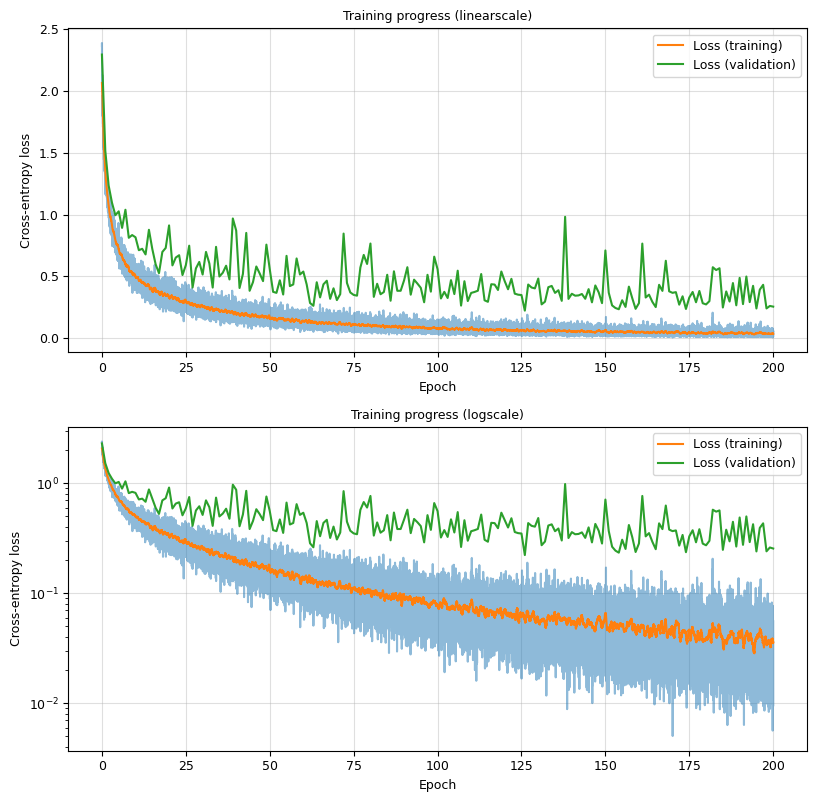

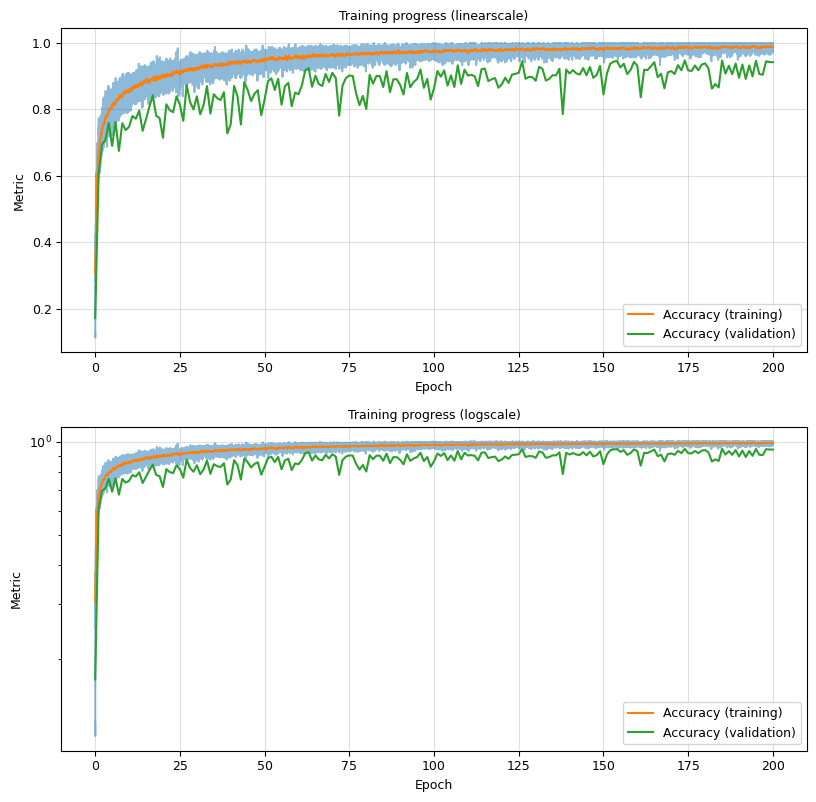

In [10]:
plot.plot_loss(trainer_mlp.log)
plot.plot_metrics(trainer_mlp.log)

> We can see that the model converges rather smoothly but there is some overfitting.
> 
> Note: I am using a fixed train-validation-test split of the data.

#### Evaluation

In [12]:
_, model_mlp, _, _ = utils_checkpoints.load(path_dir_exp_mlp / "checkpoints" / "final.pth")
print(torchsummary.summary(model_mlp, [config.MODEL["kwargs"]["num_channels_in"]]))

evaluator_mlp = Evaluator("svhn_mlp", model_mlp)
evaluator_mlp.evaluate()

print(f"Loss on test data: {evaluator_mlp.log["total"]["loss"]}")
print(f"Metrics on test data")
for name, metrics in evaluator_mlp.log["total"]["metrics"].items():
    print(f"    {name:<10}: {metrics}")

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 10]                  --
|    └─Flatten: 2-1                      [-1, 3072]                --
|    └─Linear: 2-2                       [-1, 1024]                3,146,752
|    └─BatchNorm1d: 2-3                  [-1, 1024]                2,048
|    └─ReLU: 2-4                         [-1, 1024]                --
|    └─Dropout: 2-5                      [-1, 1024]                --
|    └─Linear: 2-6                       [-1, 256]                 262,400
|    └─BatchNorm1d: 2-7                  [-1, 256]                 512
|    └─ReLU: 2-8                         [-1, 256]                 --
|    └─Dropout: 2-9                      [-1, 256]                 --
|    └─Linear: 2-10                      [-1, 64]                  16,448
|    └─BatchNorm1d: 2-11                 [-1, 64]                  128
|    └─ReLU: 2-12                        [-1, 64]               

Validating: Batch 100 | Loss 0.97178: 100%|██████████| 102/102 [00:00<00:00, 108.08it/s]

Loss on test data: 1.0617861057177744
Metrics on test data
    Accuracy  : 0.8063537185003073


> On the unseen test data, the model reaches an accuracy of approx $0.81$ which is not bad compared to assignment 1.

### Training the CNN
<a id='training_the_cnn'></a>

In [13]:
path_dir_exp_cnn = Path(config._PATH_DIR_EXPS) / "svhn_cnn"

init_exp.init_exp(name_exp="svhn_cnn", name_config="svhn_cnn")
config.set_config_exp(path_dir_exp_cnn)

Initializing experiment svhn_cnn...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/assignment/configs/svhn_cnn.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn/config.yaml
Initializing experiment svhn_cnn finished
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn/config.yaml


#### Optimization of hyperparameters

In [5]:
optimizer_hyperparams_cnn = OptimizerHyperparams(name_exp="svhn_cnn")
optimizer_hyperparams_cnn.create_study(load_if_exists=False)
optimizer_hyperparams_cnn.optimize(num_epochs=10, num_trials=50)

Creating study...


[I 2024-05-15 19:28:38,535] A new study created in RDB with name: study


Creating study finished
Optimizing...
    Trials    : 50
    Epochs    : 10


[I 2024-05-15 19:29:09,461] Trial 0 finished with value: 0.8514196014196014 and parameters: {'Learning rate': 0.0005226676387107944, 'Hidden dimensions of body': '[128]', 'Hidden dimensions of head': '[128]', 'Convolution kernel shape': '[3, 3]', 'Normalization layer in body': None, 'Activation layer in body': 'ReLU', 'Pooling layer in body': 'MaxPool2d', 'Usage of bias in convolution': False, 'Padding in convolution': 'same', 'Padding mode in convolution': 'circular'}. Best is trial 0 with value: 0.8514196014196014.
[I 2024-05-15 19:29:39,605] Trial 1 finished with value: 0.5234097734097735 and parameters: {'Learning rate': 0.0004531904155555682, 'Hidden dimensions of body': '[64, 128, 256]', 'Hidden dimensions of head': '[512]', 'Convolution kernel shape': '[1, 1]', 'Normalization layer in body': None, 'Activation layer in body': 'ReLU', 'Pooling layer in body': 'AvgPool2d', 'Usage of bias in convolution': True, 'Padding in convolution': 'valid', 'Padding mode in convolution': 'repli

Study results
    Trials finished: 53
    Trials completed: 50
Best trial
    Number    : 27
    Value     : 0.984984984984985
    Params    : {'Learning rate': 0.0007355658045885233, 'Hidden dimensions of body': '[64, 128, 256]', 'Hidden dimensions of head': '[]', 'Convolution kernel shape': '[7, 7]', 'Normalization layer in body': 'InstanceNorm2d', 'Activation layer in body': 'ReLU', 'Pooling layer in body': 'MaxPool2d', 'Usage of bias in convolution': True, 'Padding in convolution': 'same', 'Padding mode in convolution': 'reflect'}
Optimizing finished


In [6]:
study_cnn = utils_optuna.load_study(path_db=path_dir_exp_cnn / "optuna.db")
name_target_cnn = config.OPTIMIZATION_HYPERPARAMS["metric"]

print(f"Best {name_target_cnn}: {study_cnn.best_value}")
print(f"Best parameters")
for param, value in study_cnn.best_params.items():
    print(f"    {param:<30}: {value}")

Best Accuracy: 0.984984984984985
Best parameters
    Learning rate                 : 0.0007355658045885233
    Hidden dimensions of body     : [64, 128, 256]
    Hidden dimensions of head     : []
    Convolution kernel shape      : [7, 7]
    Normalization layer in body   : InstanceNorm2d
    Activation layer in body      : ReLU
    Pooling layer in body         : MaxPool2d
    Usage of bias in convolution  : True
    Padding in convolution        : same
    Padding mode in convolution   : reflect


In [7]:
optuna.visualization.plot_slice(study_cnn, target_name=name_target_cnn).show()
optuna.visualization.plot_param_importances(study_cnn, target_name=name_target_cnn).show()

> Again, I made some slight changes like reducing the hidden dimension sizes to $[32, 64, 128]$ which is almost as good as a much larger model. I set the convolutional kernel size to $[5, 5]$. The corresponding experiment config file has been updated accordingly.

#### Training

In [14]:
trainer_cnn = Trainer("svhn_cnn")
trainer_cnn.loop(config.TRAINING["num_epochs"])

Setting up dataloaders...
Train dataset
Dataset SVHN
    Number of datapoints: 58605
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: train
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Validate dataset
Dataset SVHN
    Number of datapoints: 14652
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: validate
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloaders finished
Setting up model...
Model
CNN2d(
  (body): Sequential(
    (0): BlockCNN2d(
      (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=same, padding_mode=reflect)
      (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=[2, 2], stride=[2, 2], padding=0, dilation=1, ceil_mode=False)
    )
    (1): BlockCNN2d(
      (0): Conv2d(32, 64, kernel_si

Validating: Epoch 000 | Batch 050 | Loss 2.47663: 100%|██████████| 58/58 [00:00<00:00, 89.43it/s] 
Training: Epoch 001 | Batch 220 | Loss 0.53636: 100%|██████████| 229/229 [00:02<00:00, 111.04it/s]
Validating: Epoch 001 | Batch 050 | Loss 0.53411: 100%|██████████| 58/58 [00:00<00:00, 86.51it/s] 
Training: Epoch 002 | Batch 220 | Loss 0.40333: 100%|██████████| 229/229 [00:02<00:00, 109.03it/s]
Validating: Epoch 002 | Batch 050 | Loss 0.39416: 100%|██████████| 58/58 [00:00<00:00, 86.59it/s] 
Training: Epoch 003 | Batch 220 | Loss 0.29951: 100%|██████████| 229/229 [00:02<00:00, 108.46it/s]
Validating: Epoch 003 | Batch 050 | Loss 0.35821: 100%|██████████| 58/58 [00:00<00:00, 97.97it/s] 
Training: Epoch 004 | Batch 220 | Loss 0.27483: 100%|██████████| 229/229 [00:02<00:00, 103.50it/s]
Validating: Epoch 004 | Batch 050 | Loss 0.30979: 100%|██████████| 58/58 [00:00<00:00, 89.97it/s] 
Training: Epoch 005 | Batch 220 | Loss 0.28334: 100%|██████████| 229/229 [00:02<00:00, 107.59it/s]
Validating

Looping finished


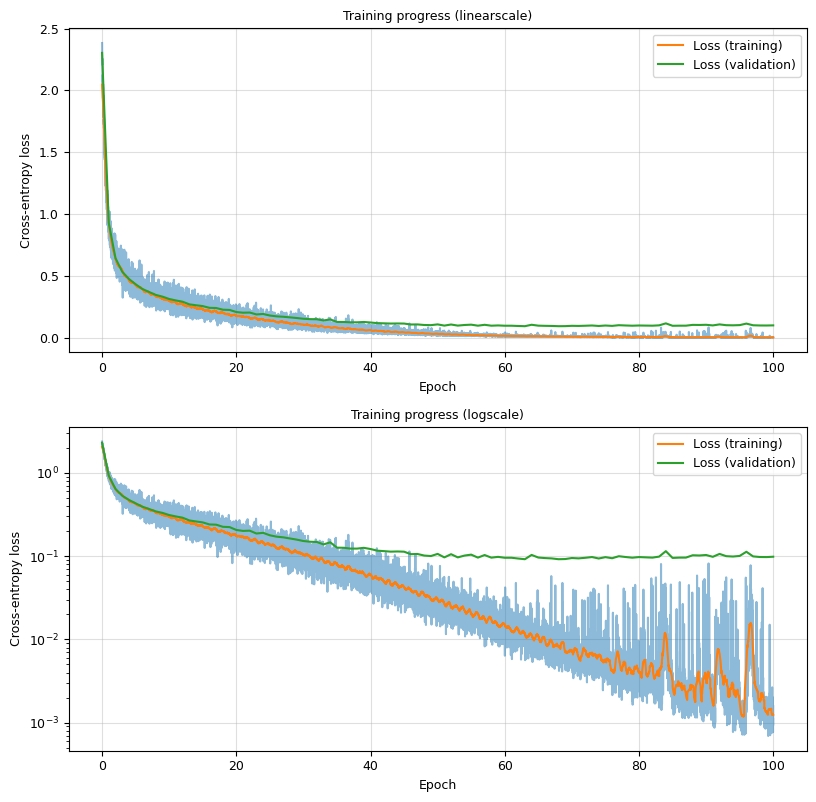

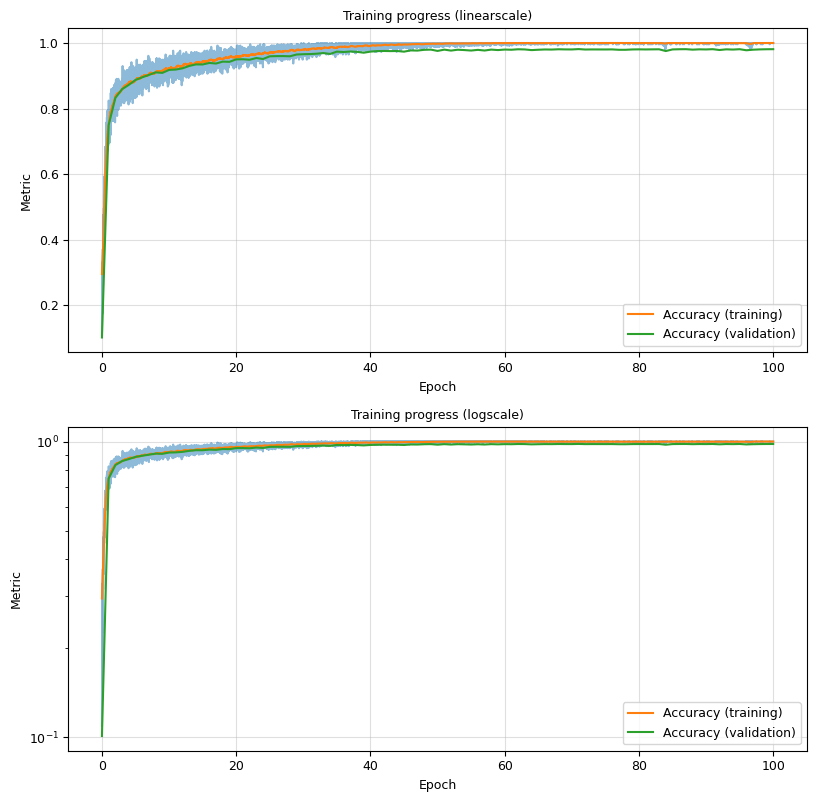

In [8]:
plot.plot_loss(trainer_cnn.log)
plot.plot_metrics(trainer_cnn.log)

> No surprises here. The CNN is much better. It converges quiet fast.
>
> Some weird spikes occured after some epochs. Some small ones are still in the current plot. I strongly reduced the learning rate and which helped (exploding gradients?, numerical issues?). There is still some overfitting but its very slight on an absolute scale. The validation loss is much smoother than for the MLP which might indicate better generalization.

#### Evaluation

In [15]:
_, model_cnn, _, _ = utils_checkpoints.load(path_dir_exp_cnn / "checkpoints" / "final.pth")
print(torchsummary.summary(model_cnn, config.MODEL["kwargs"]["shape_input"]))

evaluator_cnn = Evaluator("svhn_cnn", model_cnn)
evaluator_cnn.evaluate()

print(f"Loss on test data: {evaluator_cnn.log["total"]["loss"]}")
print(f"Metrics on test data")
for name, metrics in evaluator_cnn.log["total"]["metrics"].items():
    print(f"    {name:<10}: {metrics}")

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 128, 4, 4]           --
|    └─BlockCNN2d: 2-1                   [-1, 32, 16, 16]          --
|    |    └─Conv2d: 3-1                  [-1, 32, 32, 32]          2,432
|    |    └─InstanceNorm2d: 3-2          [-1, 32, 32, 32]          --
|    |    └─ReLU: 3-3                    [-1, 32, 32, 32]          --
|    |    └─MaxPool2d: 3-4               [-1, 32, 16, 16]          --
|    └─BlockCNN2d: 2-2                   [-1, 64, 8, 8]            --
|    |    └─Conv2d: 3-5                  [-1, 64, 16, 16]          51,264
|    |    └─InstanceNorm2d: 3-6          [-1, 64, 16, 16]          --
|    |    └─ReLU: 3-7                    [-1, 64, 16, 16]          --
|    |    └─MaxPool2d: 3-8               [-1, 64, 8, 8]            --
|    └─BlockCNN2d: 2-3                   [-1, 128, 4, 4]           --
|    |    └─Conv2d: 3-9                  [-1, 128, 8, 8]           204,928
|  

Validating: Batch 100 | Loss 0.37699: 100%|██████████| 102/102 [00:00<00:00, 102.74it/s]

Loss on test data: 0.4231404592892694
Metrics on test data
    Accuracy  : 0.91329901659496


### Discussion

> The architectures of both models have been printed and discussed above.
> In summary, the two-hidden-layer MLP has $3428938$ trainable parameters and reaches an accuracy of approx. $0.81$.
> The fully convolutional CNN has three increasingly wide convolutional layers, only $279,114$ trainable parameters and reaches an accuracy of approx. $0.913$ on the test dataset. It was still much better on the validation set.

> In summary, the CNN approach of focusing early on local features and building up a hierarchy of more abstract features is not only much more efficient than the general MLP approach but also performs much better.

## Visualization of convolutional kernels (weights) and activations (feature maps)

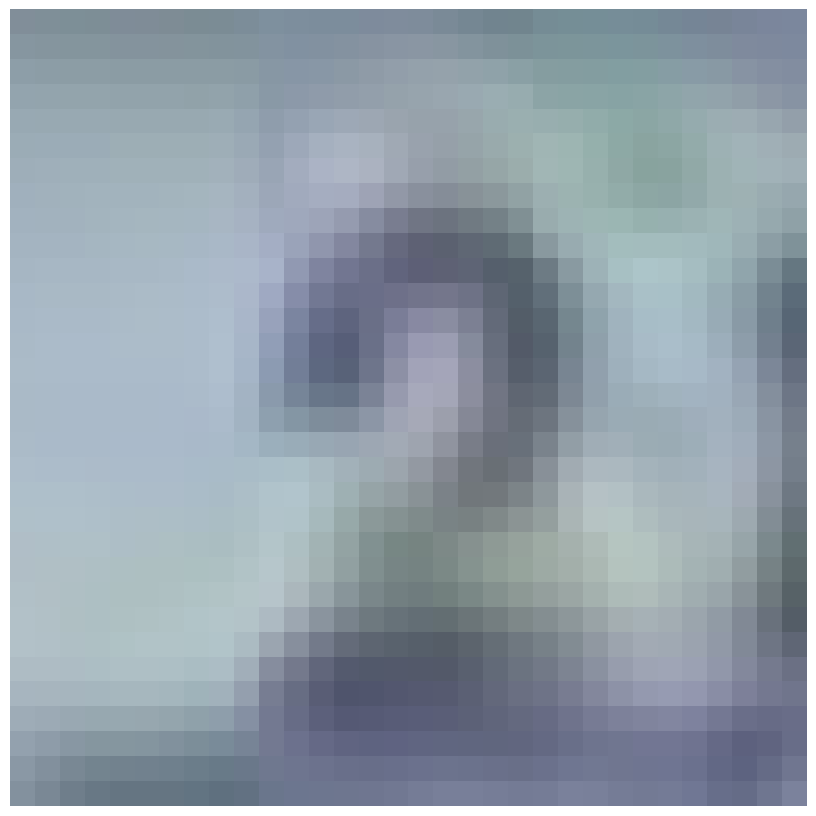

In [16]:
dataset_test, dataloader_test = utils_data.create_dataset_and_dataloader(split="test")
images = torch.unsqueeze(dataset_test[1][0].detach(), 0)

visualize.visualize_images(images)

### Weights

Convolutional layers
['body.0.0', 'body.1.0', 'body.2.0']


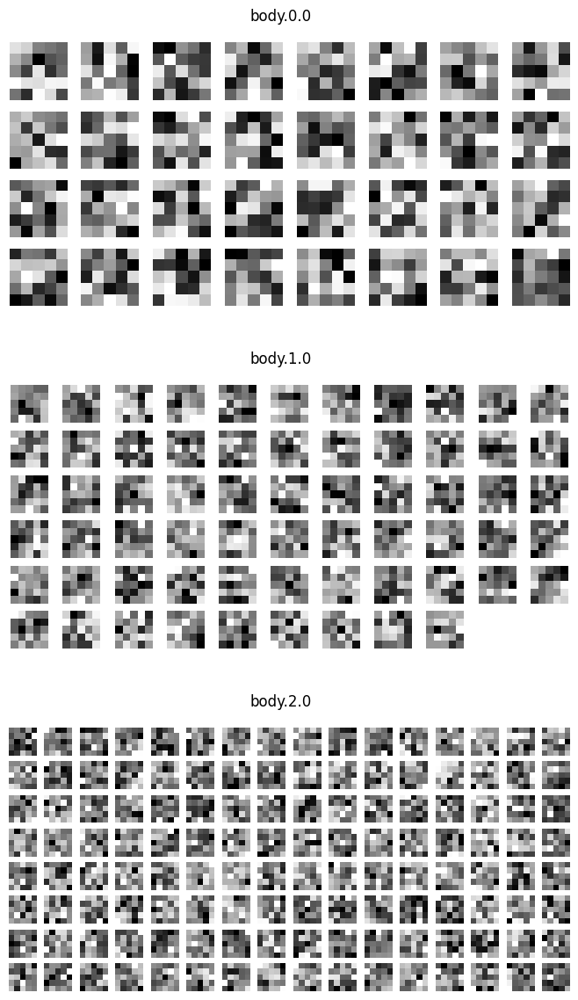

In [17]:
_, model, _, _ = utils_checkpoints.load(path_dir_exp_cnn / "checkpoints" / "final.pth")
model = utils_model.freeze(model)

names_nodes = []
kernels = {}
for name, module in model.named_modules():
    if isinstance(module, torch.nn.modules.conv.Conv2d):
        names_nodes += [name]
        kernels[name] = module.weight.detach().clone()

print("Convolutional layers")
print(names_nodes)

visualize.visualize_kernels(kernels)

### Feature maps

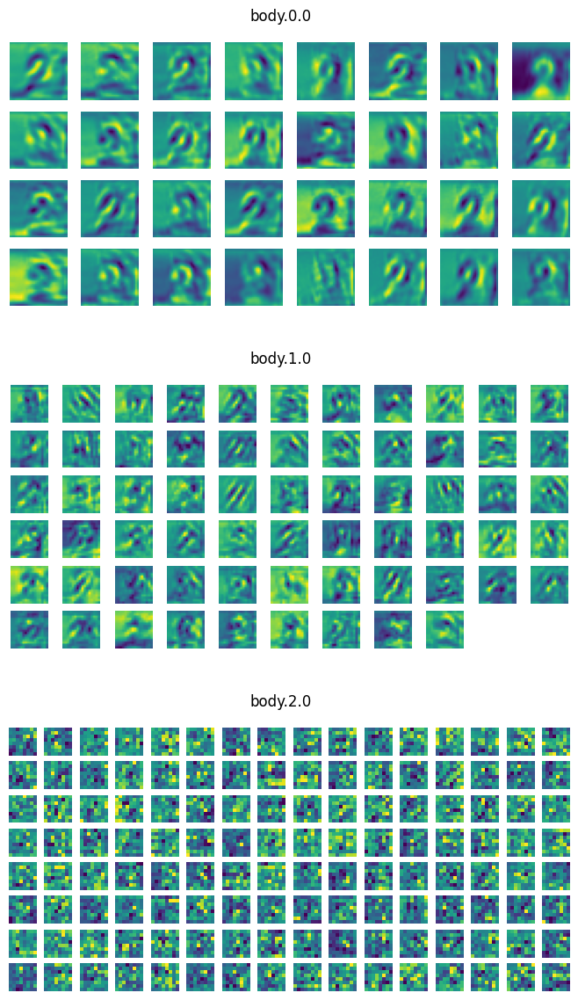

In [18]:
feature_extractor = feature_extraction.create_feature_extractor(model, return_nodes=names_nodes)
featuremaps = feature_extractor(images)

visualize.visualize_featuremaps(featuremaps)

### Discussion

What do they represent?

> The first figure shows an input image fed into the CNN. The second figure shows a single channel of the kernel weights that have been applied to the input image and feature maps. Lastly, the third figure shows the intermediate feature maps when feeding the input image into the model.
> 
> The hierarchical structure of this feedforward network can be observed here. The earliest layer (`body.0.0`) works as the most low-level feature extractor. One would expect to see lines and other simple structures. Arguably, the kernels in `body.2.0` seem less structured but it is not as clear as with the feature maps. They correspond to the more abstract features using features from a larger perceptive field. Finally, this is leading to the semantically meaningful representation as class label prediction.
> 
>  In accordance to this, the earlier feature maps somewhat resemble the input image with simple features highlighted, such as edges or corners. The second level of feature maps shows patterns which are clearly structured but do not resemble the input image as much anymore.The original image is increasingly obscured in the following layers, as both the receptive area of the neurons and the level of abstraction grow. From more abstract features the classifying head of the model is able to predict the class correctly.

## Comparison of regularization methods

### No regularization

See in [Training the CNN](#training_the_cnn)

### $\mathcal{L}_2$ regularization

In [19]:
path_dir_exp_cnn_l2 = Path(config._PATH_DIR_EXPS) / "svhn_cnn_l2"

init_exp.init_exp(name_exp="svhn_cnn_l2", name_config="svhn_cnn_l2")
config.set_config_exp(path_dir_exp_cnn_l2)

Initializing experiment svhn_cnn_l2...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/assignment/configs/svhn_cnn_l2.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2/config.yaml
Initializing experiment svhn_cnn_l2 finished
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l2/config

In [20]:
trainer_cnn_l2 = Trainer("svhn_cnn_l2")
trainer_cnn_l2.loop(config.TRAINING["num_epochs"])

Setting up dataloaders...
Train dataset
Dataset SVHN
    Number of datapoints: 58605
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: train
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Validate dataset
Dataset SVHN
    Number of datapoints: 14652
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: validate
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloaders finished
Setting up model...
Model
CNN2d(
  (body): Sequential(
    (0): BlockCNN2d(
      (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=same, padding_mode=reflect)
      (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=[2, 2], stride=[2, 2], padding=0, dilation=1, ceil_mode=False)
    )
    (1): BlockCNN2d(
      (0): Conv2d(32, 64, kernel_si

Validating: Epoch 000 | Batch 050 | Loss 2.42990: 100%|██████████| 58/58 [00:00<00:00, 85.31it/s] 
Training: Epoch 001 | Batch 220 | Loss 0.52446: 100%|██████████| 229/229 [00:02<00:00, 103.49it/s]
Validating: Epoch 001 | Batch 050 | Loss 0.55977: 100%|██████████| 58/58 [00:00<00:00, 80.95it/s] 
Training: Epoch 002 | Batch 220 | Loss 0.31441: 100%|██████████| 229/229 [00:02<00:00, 108.10it/s]
Validating: Epoch 002 | Batch 050 | Loss 0.40763: 100%|██████████| 58/58 [00:00<00:00, 67.11it/s]
Training: Epoch 003 | Batch 220 | Loss 0.43473: 100%|██████████| 229/229 [00:02<00:00, 106.46it/s]
Validating: Epoch 003 | Batch 050 | Loss 0.34084: 100%|██████████| 58/58 [00:00<00:00, 83.80it/s] 
Training: Epoch 004 | Batch 220 | Loss 0.37728: 100%|██████████| 229/229 [00:02<00:00, 109.36it/s]
Validating: Epoch 004 | Batch 050 | Loss 0.29583: 100%|██████████| 58/58 [00:00<00:00, 88.66it/s] 
Training: Epoch 005 | Batch 220 | Loss 0.35442: 100%|██████████| 229/229 [00:02<00:00, 108.13it/s]
Validating:

Looping finished


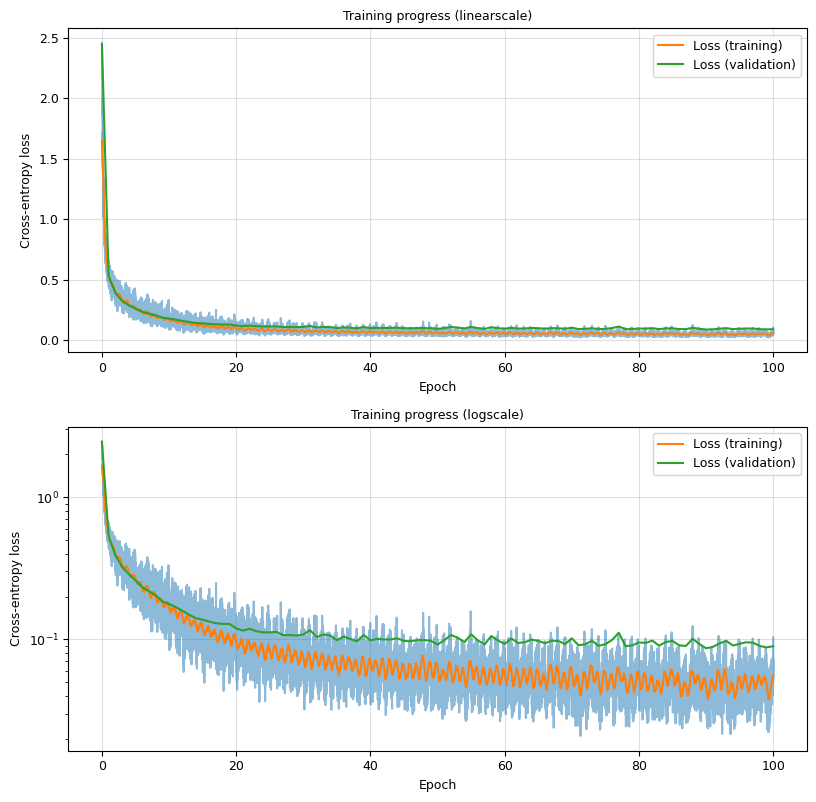

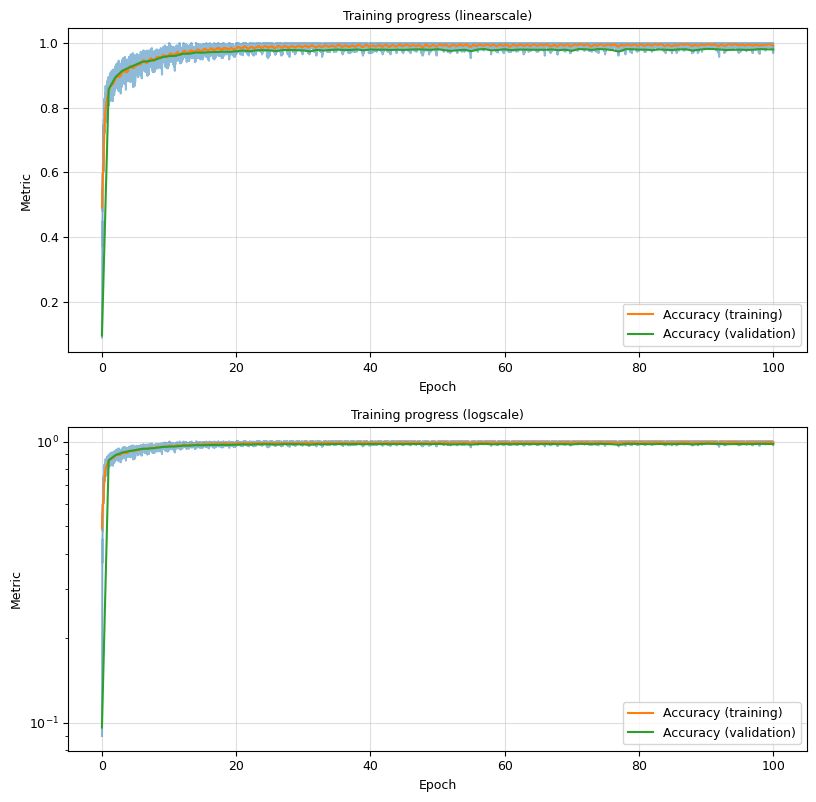

In [21]:
plot.plot_loss(trainer_cnn_l2.log)
plot.plot_metrics(trainer_cnn_l2.log)

In [27]:
_, model_cnn_l2, _, _ = utils_checkpoints.load(path_dir_exp_cnn_l2 / "checkpoints" / "final.pth")

evaluator_cnn_l2 = Evaluator("svhn_cnn_l2", model_cnn_l2)
evaluator_cnn_l2.evaluate()

print(f"Loss on test data: {evaluator_cnn_l2.log["total"]["loss"]}")
print(f"Metrics on test data")
for name, metrics in evaluator_cnn_l2.log["total"]["metrics"].items():
    print(f"    {name:<10}: {metrics}")

Setting up dataloader...
Test dataset
Dataset SVHN
    Number of datapoints: 26032
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: test
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloader finished
Setting up criterion...
Setting up criterion finished
Setting up measurers...
Setting up measurers finished


Validating: Batch 100 | Loss 20.93285: 100%|██████████| 102/102 [00:01<00:00, 92.96it/s]

Loss on test data: 20.99265132451541
Metrics on test data
    Accuracy  : 0.9183312845728334


### $\mathcal{L}_1$ regularization

In [25]:
path_dir_exp_cnn_l1 = Path(config._PATH_DIR_EXPS) / "svhn_cnn_l1"

init_exp.init_exp(name_exp="svhn_cnn_l1", name_config="svhn_cnn_l1")
config.set_config_exp(path_dir_exp_cnn_l1)

Initializing experiment svhn_cnn_l1...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/assignment/configs/svhn_cnn_l1.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1/config.yaml
Initializing experiment svhn_cnn_l1 finished
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_l1/config

In [26]:
trainer_cnn_l1 = Trainer("svhn_cnn_l1")
trainer_cnn_l1.loop(config.TRAINING["num_epochs"])

Setting up dataloaders...


Train dataset
Dataset SVHN
    Number of datapoints: 58605
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: train
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Validate dataset
Dataset SVHN
    Number of datapoints: 14652
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: validate
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloaders finished
Setting up model...
Model
CNN2d(
  (body): Sequential(
    (0): BlockCNN2d(
      (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=same, padding_mode=reflect)
      (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=[2, 2], stride=[2, 2], padding=0, dilation=1, ceil_mode=False)
    )
    (1): BlockCNN2d(
      (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), 

Validating: Epoch 000 | Batch 050 | Loss 78.84438: 100%|██████████| 58/58 [00:00<00:00, 64.61it/s]
Training: Epoch 001 | Batch 220 | Loss 9.25657: 100%|██████████| 229/229 [00:02<00:00, 102.53it/s] 
Validating: Epoch 001 | Batch 050 | Loss 8.23288: 100%|██████████| 58/58 [00:00<00:00, 77.72it/s]
Training: Epoch 002 | Batch 220 | Loss 3.22939: 100%|██████████| 229/229 [00:02<00:00, 101.08it/s]
Validating: Epoch 002 | Batch 050 | Loss 3.20147: 100%|██████████| 58/58 [00:00<00:00, 78.80it/s]
Training: Epoch 003 | Batch 220 | Loss 2.56147: 100%|██████████| 229/229 [00:02<00:00, 103.50it/s]
Validating: Epoch 003 | Batch 050 | Loss 2.57799: 100%|██████████| 58/58 [00:00<00:00, 80.76it/s] 
Training: Epoch 004 | Batch 220 | Loss 2.19739: 100%|██████████| 229/229 [00:02<00:00, 105.00it/s]
Validating: Epoch 004 | Batch 050 | Loss 2.22579: 100%|██████████| 58/58 [00:00<00:00, 84.42it/s]
Training: Epoch 005 | Batch 220 | Loss 2.01790: 100%|██████████| 229/229 [00:02<00:00, 96.58it/s] 
Validating: 

Looping finished


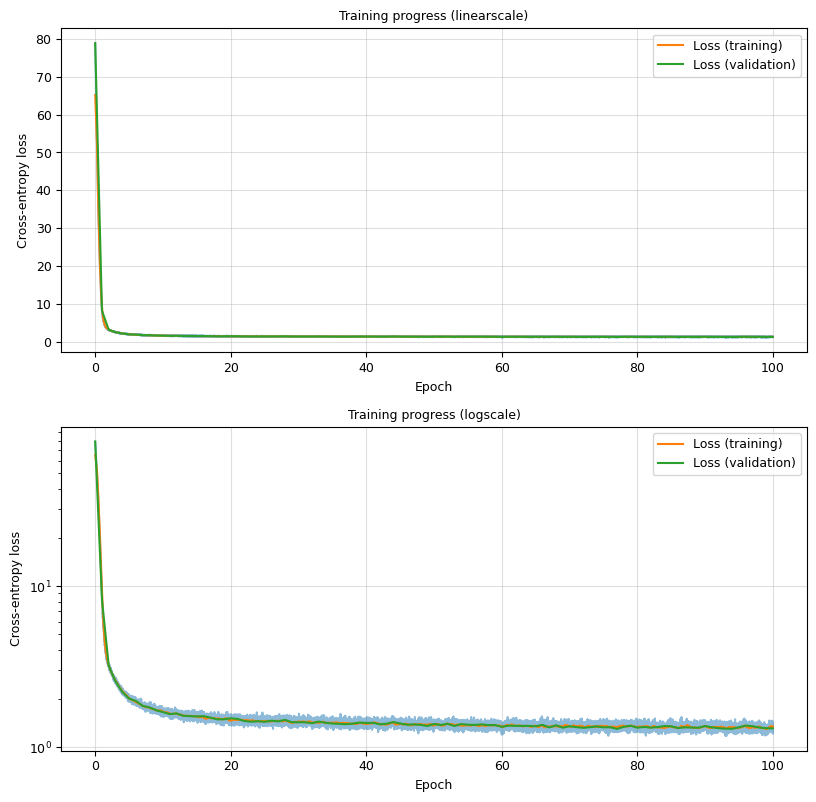

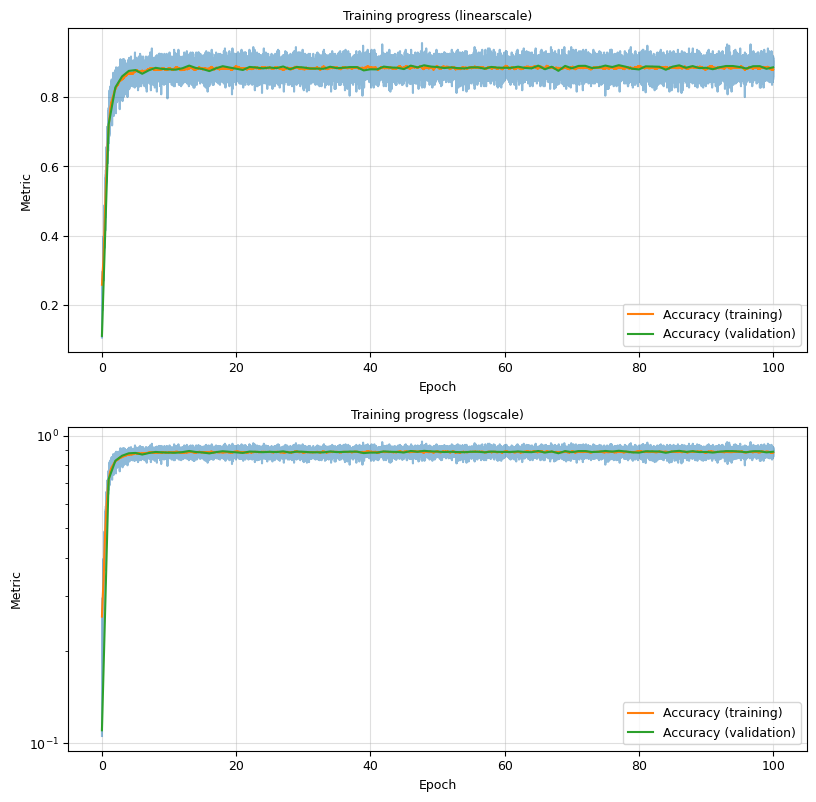

In [28]:
plot.plot_loss(trainer_cnn_l1.log)
plot.plot_metrics(trainer_cnn_l1.log)

In [29]:
_, model_cnn_l1, _, _ = utils_checkpoints.load(path_dir_exp_cnn_l1 / "checkpoints" / "final.pth")

evaluator_cnn_l1 = Evaluator("svhn_cnn_l1", model_cnn_l1)
evaluator_cnn_l1.evaluate()

print(f"Loss on test data: {evaluator_cnn_l1.log["total"]["loss"]}")
print(f"Metrics on test data")
for name, metrics in evaluator_cnn_l1.log["total"]["metrics"].items():
    print(f"    {name:<10}: {metrics}")

Setting up dataloader...
Test dataset
Dataset SVHN
    Number of datapoints: 26032
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: test
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloader finished
Setting up criterion...
Setting up criterion finished
Setting up measurers...
Setting up measurers finished


Validating: Batch 100 | Loss 1.30799: 100%|██████████| 102/102 [00:01<00:00, 89.07it/s] 

Loss on test data: 1.31426691312913
Metrics on test data
    Accuracy  : 0.8824523663183774


### Discussion

> The $\mathcal{L}_2$ regularization is easily implemented (at least after I put so much work in before). In the corresponding config, a weight decay argument is added to the optimizer which implements the regularization. One could have easily implemented the $\mathcal{L}_2$ just like the $\mathcal{L}_1$ norm, but this is easier. The $\mathcal{L}_1$ norm is hard-coded into the trainer.py.
>
> When using the $\mathcal{L}_2$ norm one can see in the logarithmic loss plot that the overfitting is reduced. Without regularization the loss on the training data is still exponentially descreasing while the validation loss stagnates. This is handled better using the regularization. The final accuracy on the test dataset is also increased ($0.918$ vs. $0.913$). The smaller network weight force the model to generalize better.
>
> When using the $\mathcal{L}_1$ the overfitting effect between the train and validation datasets completely vanishes. However, the loss and the accuracy do not progress as far as for the other two cases. The sparsity of the weights does have a negative effect on the performance. I also tried a few other values for weighting the regularization term, but I did not achieve both regularization and improvement of performance.

Compare the results: training and validation loss, accuracy, ...

## Evaluation of custom learning rate warmup and learning rate scheduler

In [34]:
class CustomSchedulerWithWarmup:
    """Not even integrated into my Python package since I will probably never use it again.
    It seems to me that Pytorch is already super flexible when using combinations of its schedulers."""

    def __init__(self, optimizer, steps_warmup=10, slope_warmup=0.1, factor_reduction=0.7, patience=7):
        self.counter_step = None
        self.counter_wait = None
        self.lr_current = None
        self.lr_initial = None
        self.log = None
        self.factor_reduction = factor_reduction
        self.loss_best = None
        self.optimizer = optimizer
        self.patience = patience
        self.slope_warmup = slope_warmup
        self.steps_warmup = steps_warmup

        self._initialize()

    def _initialize(self):
        self.counter_step = 0
        self.counter_wait = 0
        self.log = []
        self.lr_initial = self.optimizer.param_groups[0]["lr"]
        self.lr_current = self.lr_initial

    def update_lr(self, step, loss):
        if step <= self.steps_warmup:
            self.lr_current = self.lr_initial * (1 + self.slope_warmup * (step - self.steps_warmup) + 0.2 * np.cos(step * self.steps_warmup * 2 * np.pi))
        else:
            if self.loss_best is None or loss < self.loss_best:
                self.loss_best = loss
                self.counter_wait = 0
            else:
                self.counter_wait += 1

        if self.counter_wait >= self.patience:
            self.lr_current *= self.factor_reduction
            self.counter_wait = 0

    def step(self, loss):
        self.counter_step += 1
        self.update_lr(self.counter_step, loss)
        self.optimizer.param_groups[0]["lr"] = self.lr_current
        self.log += [self.lr_current]

    def state_dict(self):
        # This line I stole from pytorch.
        return {key: value for key, value in self.__dict__.items() if key != "optimizer"}

### Training

In [35]:
path_dir_exp_cnn_scheduling = Path(config._PATH_DIR_EXPS) / "svhn_cnn_scheduling"

init_exp.init_exp(name_exp="svhn_cnn_scheduling", name_config="svhn_cnn")
config.set_config_exp(path_dir_exp_cnn_scheduling)

Initializing experiment svhn_cnn_scheduling...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_scheduling
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_scheduling/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_scheduling/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_scheduling/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_scheduling/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_2/assignment/configs/svhn_cnn.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignment_2/experiments/svhn_cnn_scheduling/config.yaml
Initializing experiment svhn_cnn_scheduling finished
Config loaded from /home/user/karacora/lab-vision-sy

In [36]:
trainer_cnn_scheduling = Trainer("svhn_cnn_scheduling")
trainer_cnn_scheduling.scheduler = CustomSchedulerWithWarmup(trainer_cnn_scheduling.optimizer)
trainer_cnn_scheduling.loop(config.TRAINING["num_epochs"])

Setting up dataloaders...


Train dataset
Dataset SVHN
    Number of datapoints: 58605
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: train
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Validate dataset
Dataset SVHN
    Number of datapoints: 14652
    Root location: /home/user/karacora/lab-vision-systems-assignments/assignment_2/data/svhn
    Split: validate
    Transform: Compose(
    ToTensor()
)
    Transform of target: Compose(
)
Setting up dataloaders finished
Setting up model...
Model
CNN2d(
  (body): Sequential(
    (0): BlockCNN2d(
      (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(1, 1), padding=same, padding_mode=reflect)
      (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=[2, 2], stride=[2, 2], padding=0, dilation=1, ceil_mode=False)
    )
    (1): BlockCNN2d(
      (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), 

Validating: Epoch 000 | Batch 050 | Loss 2.40008: 100%|██████████| 58/58 [00:00<00:00, 96.36it/s] 
Training: Epoch 001 | Batch 220 | Loss 0.61319: 100%|██████████| 229/229 [00:02<00:00, 108.97it/s]
Validating: Epoch 001 | Batch 050 | Loss 0.57945: 100%|██████████| 58/58 [00:00<00:00, 87.74it/s] 
Training: Epoch 002 | Batch 220 | Loss 0.49074: 100%|██████████| 229/229 [00:02<00:00, 111.16it/s]
Validating: Epoch 002 | Batch 050 | Loss 0.49101: 100%|██████████| 58/58 [00:00<00:00, 98.64it/s] 
Training: Epoch 003 | Batch 220 | Loss 0.45451: 100%|██████████| 229/229 [00:02<00:00, 111.04it/s]
Validating: Epoch 003 | Batch 050 | Loss 0.44596: 100%|██████████| 58/58 [00:00<00:00, 68.86it/s]
Training: Epoch 004 | Batch 220 | Loss 0.36416: 100%|██████████| 229/229 [00:02<00:00, 108.68it/s]
Validating: Epoch 004 | Batch 050 | Loss 0.39381: 100%|██████████| 58/58 [00:00<00:00, 85.07it/s] 
Training: Epoch 005 | Batch 220 | Loss 0.29543: 100%|██████████| 229/229 [00:02<00:00, 108.73it/s]
Validating:

Looping finished


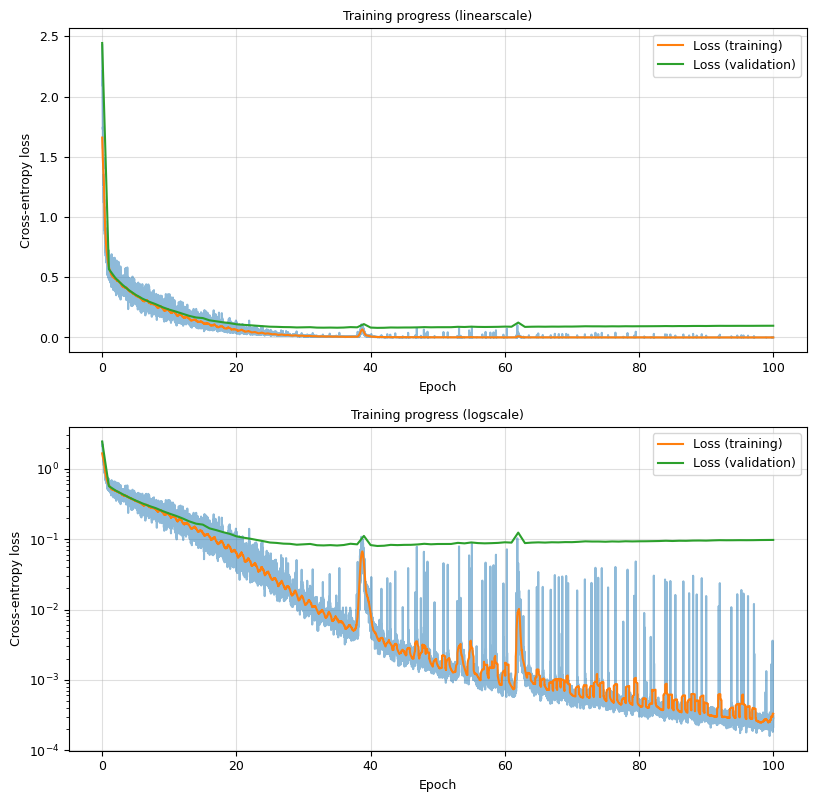

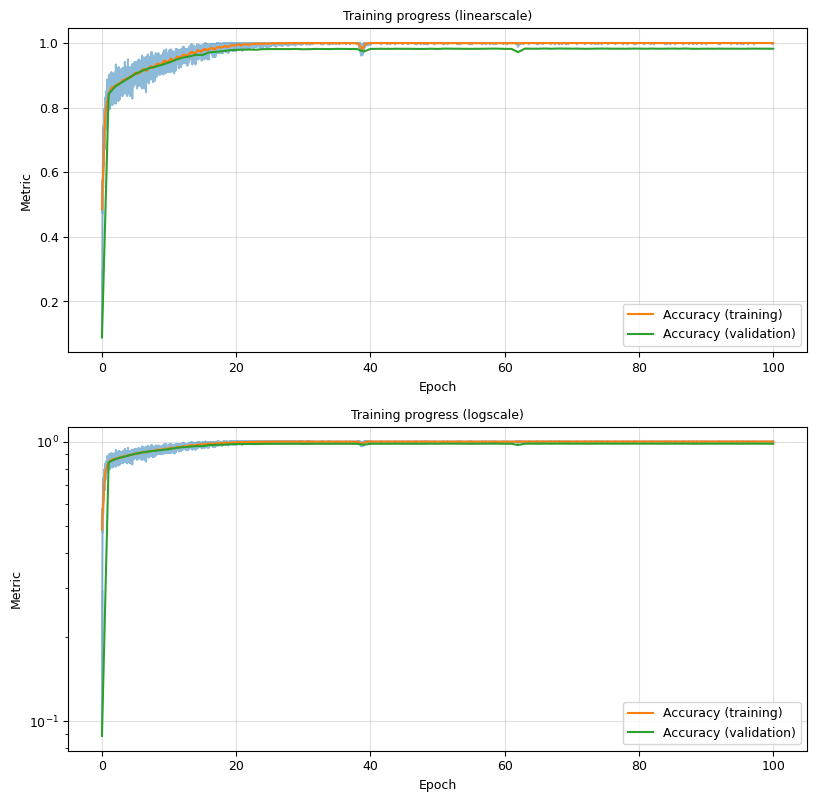

In [37]:
plot.plot_loss(trainer_cnn_scheduling.log)
plot.plot_metrics(trainer_cnn_scheduling.log)

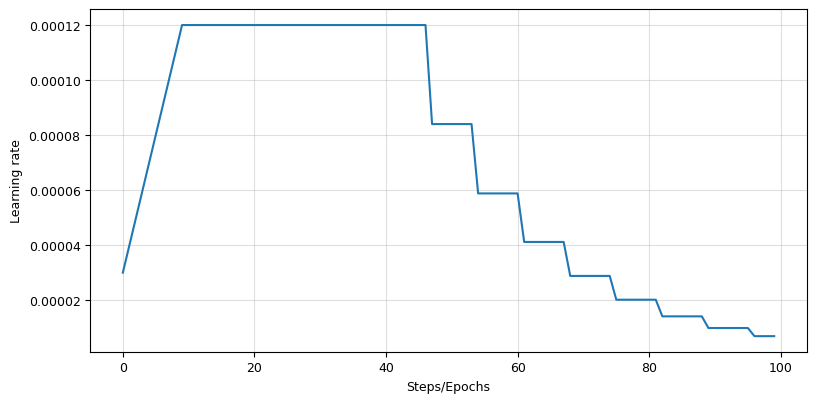

In [38]:
def plot_lr(lr):
    din_a4 = np.array([210, 297]) / 25.4
    fig = plt.figure(figsize=din_a4)

    def subplot_lr():
        ax = plt.gca()

        ax.set_xlabel("Steps/Epochs", fontsize=9)
        ax.set_ylabel("Learning rate", fontsize=9)
        ax.tick_params(axis="both", which="major", labelsize=9)
        ax.tick_params(axis="both", which="minor", labelsize=8)
        ax.grid(alpha=0.4)

        ax.plot(lr)

    fig.add_subplot(3, 1, 1)
    subplot_lr()

    plt.tight_layout()
    plt.show()


plot_lr(trainer_cnn_scheduling.scheduler.log)

### Evaluation

In [40]:
_, model_cnn_scheduling, _, _ = utils_checkpoints.load(path_dir_exp_cnn_scheduling / "checkpoints" / "final.pth")
print(torchsummary.summary(model_cnn_scheduling, config.MODEL["kwargs"]["shape_input"]))

evaluator_cnn_scheduling = Evaluator("svhn_cnn_scheduling", model_cnn_scheduling)
evaluator_cnn_scheduling.evaluate()

print(f"Loss on test data: {evaluator_cnn_scheduling.log["total"]["loss"]}")
print(f"Metrics on test data")
for name, metrics in evaluator_cnn_scheduling.log["total"]["metrics"].items():
    print(f"    {name:<10}: {metrics}")

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 128, 4, 4]           --
|    └─BlockCNN2d: 2-1                   [-1, 32, 16, 16]          --
|    |    └─Conv2d: 3-1                  [-1, 32, 32, 32]          2,432
|    |    └─InstanceNorm2d: 3-2          [-1, 32, 32, 32]          --
|    |    └─ReLU: 3-3                    [-1, 32, 32, 32]          --
|    |    └─MaxPool2d: 3-4               [-1, 32, 16, 16]          --
|    └─BlockCNN2d: 2-2                   [-1, 64, 8, 8]            --
|    |    └─Conv2d: 3-5                  [-1, 64, 16, 16]          51,264
|    |    └─InstanceNorm2d: 3-6          [-1, 64, 16, 16]          --
|    |    └─ReLU: 3-7                    [-1, 64, 16, 16]          --
|    |    └─MaxPool2d: 3-8               [-1, 64, 8, 8]            --
|    └─BlockCNN2d: 2-3                   [-1, 128, 4, 4]           --
|    |    └─Conv2d: 3-9                  [-1, 128, 8, 8]           204,928
|  

Validating: Batch 100 | Loss 0.35724: 100%|██████████| 102/102 [00:00<00:00, 106.22it/s]

Loss on test data: 0.4602549399747831
Metrics on test data
    Accuracy  : 0.9083819913952059


### Discussion

> The scheduler works as desired. However, I did not manage to mitigate overfitting using this scheduler. The evaluation result is slightly worse than the previously considered models, except for the L1 regularization. I think my model is "too powerful" and I handled the hyperparameter optimization in a way that makes it hard to mitigate overfitting. One solution would be to use optuna with more epochs but this takes much time.